# 1. 특징점 추출

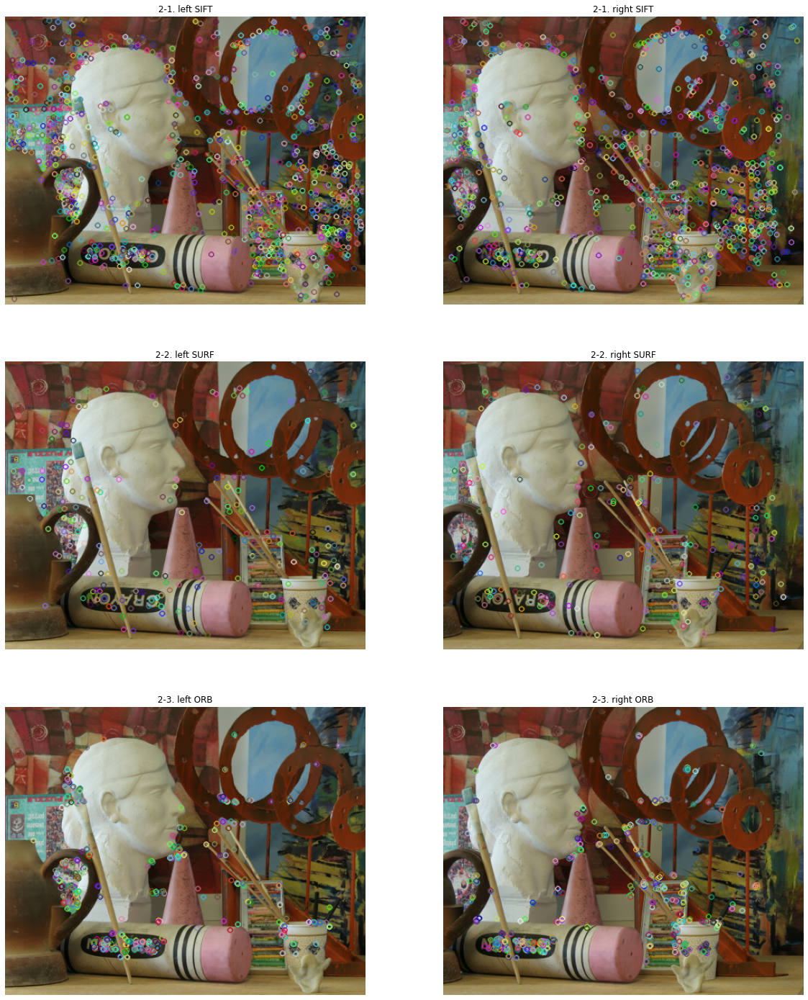

In [15]:
import cv2, numpy as np
import matplotlib.pyplot as plt

left_img = cv2.imread('./img/Art/view1.png')
right_img = cv2.imread('./img/Art/view5.png')
left_gray = cv2.cvtColor(left_img, cv2.COLOR_BGR2GRAY)
right_gray = cv2.cvtColor(right_img, cv2.COLOR_BGR2GRAY)

# SIFT 서술자 추출기 생성 ---①
sift = cv2.xfeatures2d.SIFT_create()
surf = cv2.xfeatures2d.SURF_create(1000, 3, True, True)
orb = cv2.ORB_create()

# 각 영상에 대해 키 포인트와 서술자 추출 ---②
# 1. SIFT
keypoints1, descriptors1 = sift.detectAndCompute(left_gray, None)
keypoints2, descriptors2 = sift.detectAndCompute(right_gray, None)
sift_desc_image1 = cv2.drawKeypoints(left_img, keypoints1, None, flags=cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS)
sift_desc_image2 = cv2.drawKeypoints(right_img, keypoints2, None, flags=cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS)

# 2. SURF
keypoints, descriptors = surf.detectAndCompute(left_gray, None)
keypoints2, descriptors2 = surf.detectAndCompute(right_gray, None)
surf_desc_image1 = cv2.drawKeypoints(left_img, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS)
surf_desc_image2 = cv2.drawKeypoints(right_img, keypoints2, None, flags=cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS)

# 3. ORB
keypoints, descriptors = orb.detectAndCompute(left_gray, None)
keypoints2, descriptors2 = orb.detectAndCompute(right_gray, None)
orb_desc_image1 = cv2.drawKeypoints(left_img, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS)
orb_desc_image2 = cv2.drawKeypoints(right_img, keypoints2, None, flags=cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS)

# 결과 출력 
plt.figure(figsize=(20,25))
plt.subplot(321), plt.imshow(cv2.cvtColor(sift_desc_image1, cv2.COLOR_BGR2RGB)), plt.title("2-1. left SIFT"), plt.axis("off")
plt.subplot(322), plt.imshow(cv2.cvtColor(sift_desc_image2, cv2.COLOR_BGR2RGB)), plt.title("2-1. right SIFT"), plt.axis("off")
plt.subplot(323), plt.imshow(cv2.cvtColor(surf_desc_image1, cv2.COLOR_BGR2RGB)), plt.title("2-2. left SURF"), plt.axis("off")
plt.subplot(324), plt.imshow(cv2.cvtColor(surf_desc_image2, cv2.COLOR_BGR2RGB)), plt.title("2-2. right SURF"), plt.axis("off")
plt.subplot(325), plt.imshow(cv2.cvtColor(orb_desc_image1, cv2.COLOR_BGR2RGB)), plt.title("2-3. left ORB"), plt.axis("off")
plt.subplot(326), plt.imshow(cv2.cvtColor(orb_desc_image2, cv2.COLOR_BGR2RGB)), plt.title("2-3. right ORB"), plt.axis("off")
plt.show()

# 2. 이미지 매칭 - 템플릿 기반

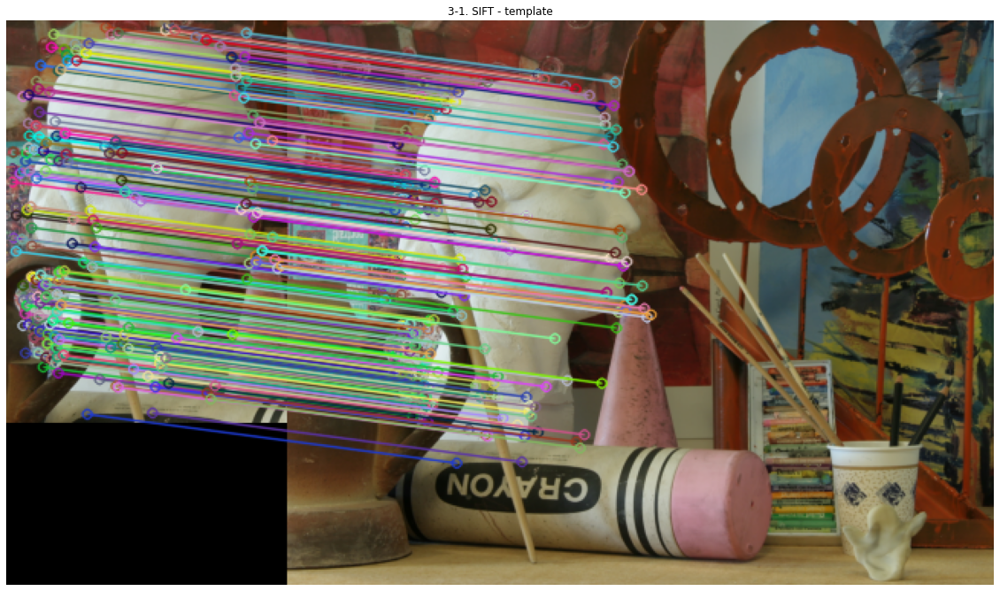

In [41]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the main image and template image
image = cv2.imread('./img/Art/view1.png')
template = image[32:296, 58:242]

sift = cv2.xfeatures2d.SIFT_create()

gray_template = cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
# SIFT feature extraction
kp1, des1 = sift.detectAndCompute(gray_template, None)
kp2, des2 = sift.detectAndCompute(gray_image, None)

flann_matcher = cv2.DescriptorMatcher_create(cv2.DescriptorMatcher_FLANNBASED)
knn_match = flann_matcher.knnMatch(des1, des2, k=2)

# Apply ratio test to filter good matches
T=0.7
good_match = []
for nearest1, nearest2 in knn_match:
    if (nearest1.distance/nearest2.distance)<T:
        good_match.append(nearest1)


# Draw matches on the image
match_image = cv2.drawMatches(template, kp1, image, kp2, good_match, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)


# Display the matched image
plt.figure(figsize=(20,40))
plt.imshow(cv2.cvtColor(match_image, cv2.COLOR_BGR2RGB)), plt.title("3-1. SIFT - template"), plt.axis("off")
plt.show()


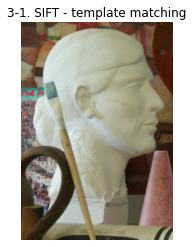

cv2.TM_CCOEFF_NORMED -0.2370688021183014 1.0 (168, 28) (58, 32)
cv2.TM_CCORR_NORMED 0.7577149868011475 1.0 (204, 66) (58, 32)
cv2.TM_SQDIFF_NORMED 1.4050801633302967e-09 0.6789100766181946 (58, 32) (279, 75)


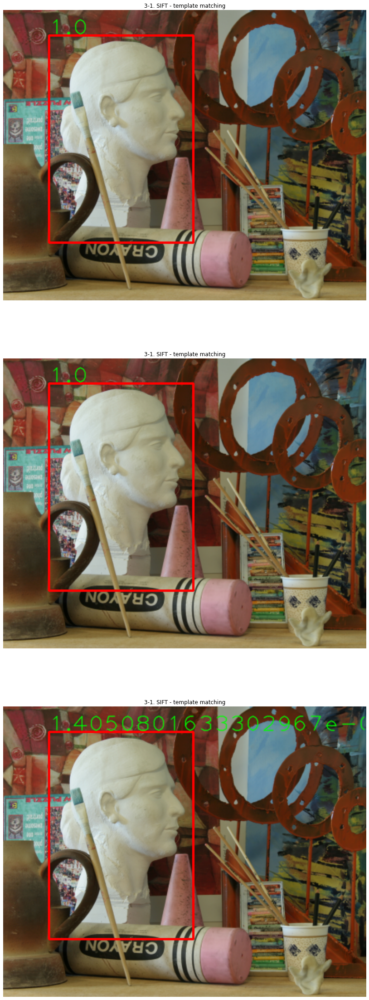

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 입력이미지와 템플릿 이미지 읽기
img = cv2.imread('./img/Art/view1.png')
template = img[32:296, 58:242]
th, tw = template.shape[:2]
plt.imshow(cv2.cvtColor(template, cv2.COLOR_BGR2RGB)), plt.axis("off"), plt.title("3-1. SIFT - template matching")
plt.show()

# 3가지 매칭 메서드 순회
plt.figure(figsize=(20,40))
methods = ['cv2.TM_CCOEFF_NORMED', 'cv2.TM_CCORR_NORMED', \
                                     'cv2.TM_SQDIFF_NORMED']
for i, method_name in enumerate(methods):
    img_draw = img.copy()
    method = eval(method_name)
    # 템플릿 매칭   ---①
    res = cv2.matchTemplate(img, template, method)
    # 최대, 최소값과 그 좌표 구하기 ---②
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
    print(method_name, min_val, max_val, min_loc, max_loc)

    # TM_SQDIFF의 경우 최소값이 좋은 매칭, 나머지는 그 반대 ---③
    if method in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]:
        top_left = min_loc
        match_val = min_val
    else:
        top_left = max_loc
        match_val = max_val
    # 매칭 좌표 구해서 사각형 표시   ---④      
    bottom_right = (top_left[0] + tw, top_left[1] + th)
    cv2.rectangle(img_draw, top_left, bottom_right, (0,0,255),2)
    # 매칭 포인트 표시 ---⑤
    cv2.putText(img_draw, str(match_val), top_left, \
                cv2.FONT_HERSHEY_PLAIN, 2,(0,255,0), 1, cv2.LINE_AA)
    
    plt.subplot(3,1,i+1), plt.imshow(cv2.cvtColor(img_draw, cv2.COLOR_BGR2RGB)), plt.axis("off"), plt.title("3-1. SIFT - template matching")
    
plt.show()    

(370, 463, 3)
[0.1767338514328003, 0.16909067332744598, 0.057598743587732315, 0.10095588117837906, 0.1400567889213562, 0.06443324685096741, 0.16636121273040771, 0.14132054150104523, 0.06492291390895844, 0.07525485754013062, 0.10220952332019806, 0.0471600778400898, 0.18259835243225098, 0.06530751287937164, 0.06534945964813232, 0.10022065788507462, 0.1953488439321518, 0.10950751602649689, 0.0726214125752449, 0.04139862209558487, 0.11108202487230301, 0.09637746214866638, 0.13484106957912445, 0.07785114645957947, 0.05786391720175743, 0.1369357407093048, 0.15816818177700043, 0.10549437254667282, 0.10820623487234116, 0.11613018065690994, 0.15372399985790253, 0.15109822154045105, 0.1000501811504364, 0.051008690148591995, 0.07338238507509232, 0.040394313633441925, 0.05365757644176483, 0.03471404314041138, 0.11997891962528229, 0.05589446425437927, 0.10987803339958191, 0.13484425842761993, 0.11709403991699219, 0.06350109726190567, 0.09762836247682571, 0.07320511341094971, 0.05982968583703041, 0.

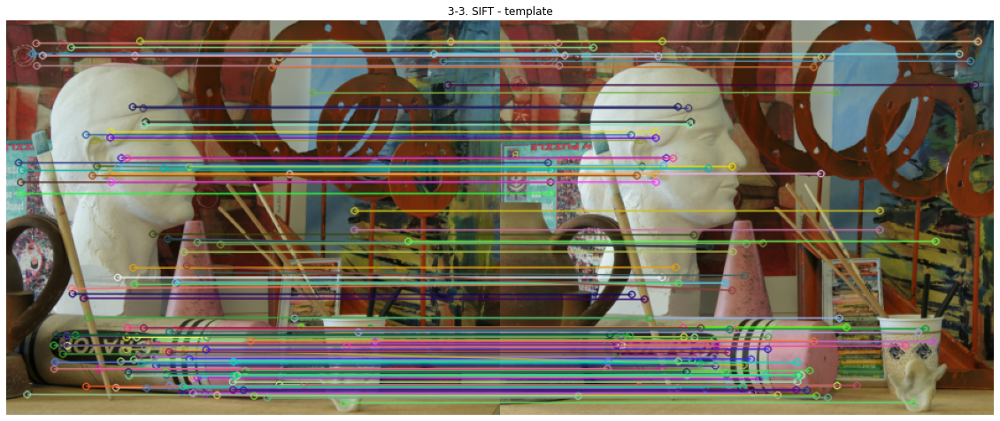

In [28]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn import metrics

# Load the main image and template image
image = cv2.imread('./img/Art/view1.png')
template = cv2.imread('./img/Art/view5.png')

surf = cv2.xfeatures2d.SURF_create()

gray_template = cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
# SIFT feature extraction
kp1, des1 = surf.detectAndCompute(gray_template, None)
kp2, des2 = surf.detectAndCompute(gray_image, None)

matcher = cv2.DescriptorMatcher_create(cv2.DescriptorMatcher_FLANNBASED)
knn_match = matcher.knnMatch(des1, des2, k=2)

# FLANN_INDEX_LSH = 6
# index_params= dict(algorithm = FLANN_INDEX_LSH,
#                    table_number = 6,
#                    key_size = 12,
#                    multi_probe_level = 1)
# # 검색 파라미터 설정 ---②
# search_params=dict(checks=32)
# matcher = cv2.FlannBasedMatcher(index_params, search_params)
# knn_match = matcher.knnMatch(des1, des2, k=2)
matching_score = [(m.distance/n.distance) for m,n in knn_match]

# Apply ratio test to filter good matches
T=0.5
good_match = []
for nearest1, nearest2 in knn_match:
    if ((nearest1.distance/nearest2.distance))<T:
        good_match.append(nearest1)

# Draw matches on the image
match_image = cv2.drawMatches(template, kp1, image, kp2, good_match, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

true_labels = [1 if score < T else 0 for score in matching_score]
print(image.shape)
print([a.distance for a in good_match])
print(matching_score)
print(true_labels)

# Display the matched image
plt.figure(figsize=(20,40))
plt.imshow(cv2.cvtColor(match_image, cv2.COLOR_BGR2RGB)), plt.title("3-3. SIFT - template"), plt.axis("off")
plt.show()

In [92]:
import cv2, numpy as np

img1 = cv2.imread('../img/taekwonv1.jpg')
img2 = img1
gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

# ORB, BF-Hamming 로 knnMatch  ---①
detector = cv2.ORB_create()
kp1, desc1 = detector.detectAndCompute(gray1, None)
kp2, desc2 = detector.detectAndCompute(gray2, None)
matcher = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
matches = matcher.match(desc1, desc2)

# 매칭 결과를 거리기준 오름차순으로 정렬 ---③
matches = sorted(matches, key=lambda x:x.distance)
# 모든 매칭점 그리기 ---④
res1 = cv2.drawMatches(img1, kp1, img2, kp2, matches, None, \
                    flags=cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS)

# 매칭점으로 원근 변환 및 영역 표시 ---⑤
src_pts = np.float32([ kp1[m.queryIdx].pt for m in matches ])
dst_pts = np.float32([ kp2[m.trainIdx].pt for m in matches ])
# RANSAC으로 변환 행렬 근사 계산 ---⑥
mtrx, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
h,w = img1.shape[:2]
pts = np.float32([ [[0,0]],[[0,h-1]],[[w-1,h-1]],[[w-1,0]] ])
dst = cv2.perspectiveTransform(pts,mtrx)
img2 = cv2.polylines(img2,[np.int32(dst)],True,255,3, cv2.LINE_AA)

# 정상치 매칭만 그리기 ---⑦
matchesMask = mask.ravel().tolist()
res2 = cv2.drawMatches(img1, kp1, img2, kp2, matches, None, \
                    matchesMask = matchesMask,
                    flags=cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS)
# 모든 매칭점과 정상치 비율 ---⑧
accuracy=float(mask.sum()) / mask.size
print("accuracy: %d/%d(%.2f%%)"% (mask.sum(), mask.size, accuracy))

# 결과 출력                    
cv2.imshow('Matching-All', res1)
cv2.imshow('Matching-Inlier ', res2)
cv2.waitKey()
cv2.destroyAllWindows()

[[-8.20955994e+00  5.16864655e+00  5.49467640e+02]
 [-4.47576372e+01  3.32376433e+01  5.94882362e+02]
 [-1.27915639e-01  1.06191978e-01  1.00000000e+00]]
accuracy: 8/66(0.12%)


# 3. 이미지 매칭 - 란삭 기반

In [47]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the main image and template image
img2 = cv2.imread('./img/Art/view2.png')
img1 = cv2.imread('./template.png')
gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

# ORB, BF-Hamming 로 knnMatch  ---①
detector = cv2.xfeatures2d.SIFT_create()
kp1, desc1 = detector.detectAndCompute(gray1, None)
kp2, desc2 = detector.detectAndCompute(gray2, None)
matcher = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)
matches = matcher.match(desc1, desc2)

print(len(desc1))

# 매칭 결과를 거리기준 오름차순으로 정렬 ---③
matches = sorted(matches, key=lambda x:x.distance)
# 모든 매칭점 그리기 ---④
res1 = cv2.drawMatches(img1, kp1, img2, kp2, matches, None, \
                    flags=cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS)

# 매칭점으로 원근 변환 및 영역 표시 ---⑤
src_pts = np.float32([ kp1[m.queryIdx].pt for m in matches ])
dst_pts = np.float32([ kp2[m.trainIdx].pt for m in matches ])
# RANSAC으로 변환 행렬 근사 계산 ---⑥
mtrx, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
h,w = img1.shape[:2]
pts = np.float32([ [[0,0]],[[0,h-1]],[[w-1,h-1]],[[w-1,0]] ])
dst = cv2.perspectiveTransform(pts,mtrx)
img2 = cv2.polylines(img2,[np.int32(dst)],True,255,3, cv2.LINE_AA)

# 정상치 매칭만 그리기 ---⑦
matchesMask = mask.ravel().tolist()     # true_label

cnt=0
for m in matchesMask:
    if m == 1:
        cnt = cnt+1

print(f"정상치로 판단되는 매칭 개수: {cnt}")
res2 = cv2.drawMatches(img1, kp1, img2, kp2, matches, None, \
                    matchesMask = matchesMask,
                    flags=cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS)

# 이상치로 판단된 대응 점들 선택
outliers = [idx for idx, value in enumerate(mask) if not value]
outlier_src_pts = [src_pts[i] for i in outliers]
outlier_dst_pts = [dst_pts[i] for i in outliers]

print(f"이상치로 판단되는 매칭 개수: {len(outliers)}")

# 추가적인 검증을 위한 예시 함수
def validate_outliers(src_pts, dst_pts, mtrx):

    threshold = 5.0  # 일치 여부를 판단하기 위한 임계값

    # 이상치로 판단된 점들과 호모그래피를 사용하여 변환 수행
    transformed_pts = cv2.perspectiveTransform(np.array(outlier_src_pts).reshape(-1, 1, 2), mtrx).reshape(-1, 2)

    # 변환된 결과와 실제 대상 이미지의 대응 좌표 비교
    real_true = 0
    real_false = 0
    src_pts2 = []
    dst_pts2 = []
    for src_pt, dst_pt, transformed_pt in zip(outlier_src_pts, outlier_dst_pts, transformed_pts):
        diff = np.linalg.norm(transformed_pt - dst_pt)  # 변환 결과와 대응 좌표 간의 거리 계산
        if diff <= threshold:
            # print("정상치로 판단됨:", "src_pt:", src_pt, "dst_pt:", dst_pt)
            src_pts2.append(src_pt)
            dst_pts2.append(dst_pt)
            
            real_false += 1
        else:
            # print("이상치로 판단됨:", "src_pt:", src_pt, "dst_pt:", dst_pt)
            real_true += 1

    mtrx, mask = cv2.findHomography(src_pts2, dst_pts2, cv2.RANSAC, 5.0)
    res3 = cv2.drawMatches(img1, kp1, img2, kp2, matches, None, \
            matchesMask = mask,
            flags=cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS)
    
    plt.imshow(cv2.cvtColor(res3, cv2.COLOR_BGR2RGB)), plt.title("3-4. SIFT - RANSAC"), plt.axis("off")
    
    print(f"이상치로 판단되는 매칭 중에서 사실 정상치였던 매칭 개수: {real_false}")
    print(f"이상치로 판단되는 매칭을 잘 수행한 매칭 개수: {real_true}")

# 검증 함수 호출
validate_outliers(src_pts, dst_pts, mtrx)


# Display the matched image
plt.figure(figsize=(20,30))
plt.subplot(311), plt.imshow(cv2.cvtColor(res1, cv2.COLOR_BGR2RGB)), plt.title("3-4. SIFT - RANSAC"), plt.axis("off")
plt.subplot(312), plt.imshow(cv2.cvtColor(res2, cv2.COLOR_BGR2RGB)), plt.title("3-4. SIFT - RANSAC"), plt.axis("off")

plt.show()


232
정상치로 판단되는 매칭 개수: 106
이상치로 판단되는 매칭 개수: 117


TypeError: srcPoints is not a numpy array, neither a scalar

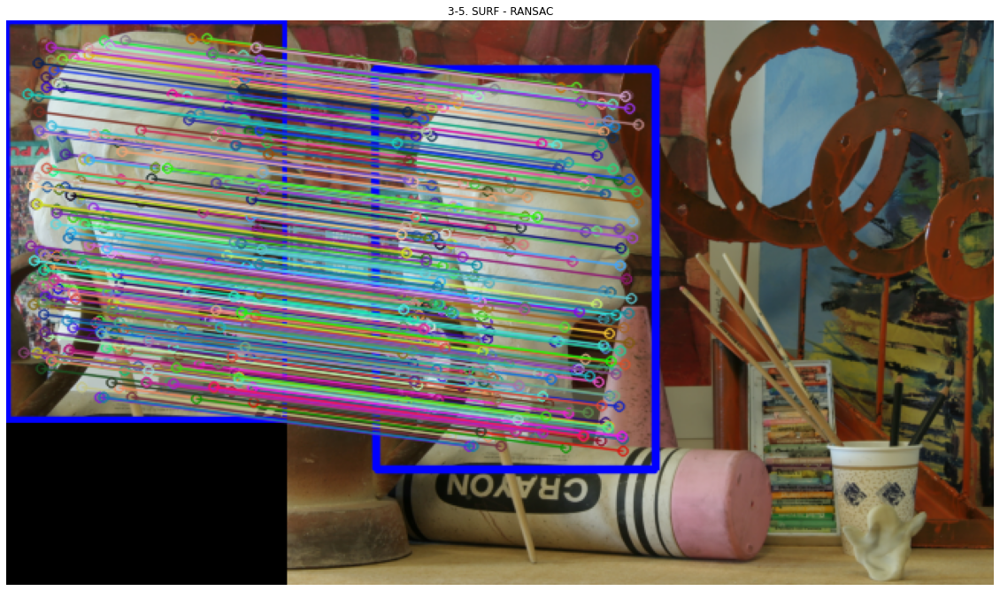

In [20]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the main image and template image
img2 = cv2.imread('./img/Art/view1.png')
img1 = img2[32:296, 58:242]
gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

# ORB, BF-Hamming 로 knnMatch  ---①
detector = cv2.xfeatures2d.SURF_create()
kp1, desc1 = detector.detectAndCompute(gray1, None)
kp2, desc2 = detector.detectAndCompute(gray2, None)
matcher = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
matches = matcher.match(desc1, desc2)

# 매칭 결과를 거리기준 오름차순으로 정렬 ---③
matches = sorted(matches, key=lambda x:x.distance)
# 모든 매칭점 그리기 ---④
res1 = cv2.drawMatches(img1, kp1, img2, kp2, matches, None, \
                    flags=cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS)

# 매칭점으로 원근 변환 및 영역 표시 ---⑤
src_pts = np.float32([ kp1[m.queryIdx].pt for m in matches ])
dst_pts = np.float32([ kp2[m.trainIdx].pt for m in matches ])
# RANSAC으로 변환 행렬 근사 계산 ---⑥
mtrx, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
h,w = img1.shape[:2]
pts = np.float32([ [[0,0]],[[0,h-1]],[[w-1,h-1]],[[w-1,0]] ])
dst = cv2.perspectiveTransform(pts,mtrx)
img2 = cv2.polylines(img2,[np.int32(dst)],True,255,3, cv2.LINE_AA)

# 정상치 매칭만 그리기 ---⑦
matchesMask = mask.ravel().tolist()
res = cv2.drawMatches(img1, kp1, img2, kp2, matches, None, \
                    matchesMask = matchesMask,
                    flags=cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS)

# Display the matched image
plt.figure(figsize=(20,40))
plt.imshow(cv2.cvtColor(res, cv2.COLOR_BGR2RGB)), plt.title("3-5. SURF - RANSAC"), plt.axis("off")
plt.show()


In [50]:
import cv2, numpy as np

img1 = cv2.imread('./template.png')
img2 = cv2.imread('./img/Art/view0.png')
gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

# ORB, BF-Hamming 로 knnMatch  ---①
detector = cv2.ORB_create()
kp1, desc1 = detector.detectAndCompute(gray1, None)
kp2, desc2 = detector.detectAndCompute(gray2, None)
matcher = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
matches = matcher.match(desc1, desc2)

# 매칭 결과를 거리기준 오름차순으로 정렬 ---③
matches = sorted(matches, key=lambda x:x.distance)
# 모든 매칭점 그리기 ---④
res1 = cv2.drawMatches(img1, kp1, img2, kp2, matches, None, \
                    flags=cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS)

# 매칭점으로 원근 변환 및 영역 표시 ---⑤
src_pts = np.float32([ kp1[m.queryIdx].pt for m in matches ])
dst_pts = np.float32([ kp2[m.trainIdx].pt for m in matches ])
# RANSAC으로 변환 행렬 근사 계산 ---⑥
mtrx, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
h,w = img1.shape[:2]
pts = np.float32([ [[0,0]],[[0,h-1]],[[w-1,h-1]],[[w-1,0]] ])
dst = cv2.perspectiveTransform(pts,mtrx)
img2 = cv2.polylines(img2,[np.int32(dst)],True,255,3, cv2.LINE_AA)

# 정상치 매칭만 그리기 ---⑦
matchesMask = mask.ravel().tolist()
res2 = cv2.drawMatches(img1, kp1, img2, kp2, matches, None, \
                    matchesMask = matchesMask,
                    flags=cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS)
# 모든 매칭점과 정상치 비율 ---⑧
accuracy=float(mask.sum()) / mask.size
print("accuracy: %d/%d(%.2f%%)"% (mask.sum(), mask.size, accuracy))

# 결과 출력                    
cv2.imshow('Matching-All', res1)
cv2.imshow('Matching-Inlier ', res2)
cv2.waitKey()
cv2.destroyAllWindows()

accuracy: 20/108(0.19%)


# 4 매칭 정확도

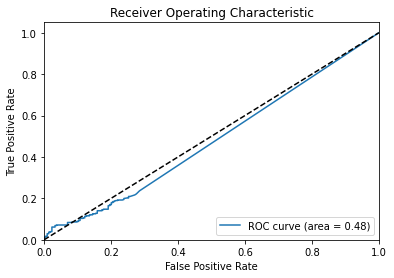

In [65]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn import metrics
import glob

def calculate_roc_curve(true_labels, matching_scores):
    fpr, tpr, thresholds = metrics.roc_curve(true_labels, matching_scores)
    roc_auc = metrics.auc(fpr, tpr)
    return fpr, tpr, roc_auc

# 이미지 매칭 함수
def match_images(target_path):
    target = cv2.imread(target_path, 0)
    template = target[32:296, 58:242]

    # 템플릿 매칭
    result = cv2.matchTemplate(target, template, cv2.TM_CCOEFF_NORMED)
    matching_scores = result.ravel()

    return matching_scores

# 매칭 결과 분석
def analyze_matching_performance(target_paths):
    true_labels = np.zeros(len(target_paths))  # 실제 매칭 여부를 표시하기 위한 레이블
    matching_scores = np.array([])  # 매칭 점수를 저장할 배열

    for i in range(len(target_paths)):
        matching_scores = np.append(matching_scores, match_images(target_paths[i]))

        # 실제 매칭 여부를 레이블에 반영 (여기서는 간단하게 예시로 앞쪽 절반은 True로 설정)
        true_labels[i] = 1 if i < len(target_paths) / 2 else 0

    fpr, tpr, roc_auc = calculate_roc_curve(true_labels, matching_scores)

    # ROC 곡선 플롯
    plt.figure()
    plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc="lower right")
    plt.show()

# 이미지 경로 설정
target_paths = glob.glob('./img/Art/view*.png')

# 매칭 결과 분석 수행
analyze_matching_performance(target_paths)


# SIFT ROC

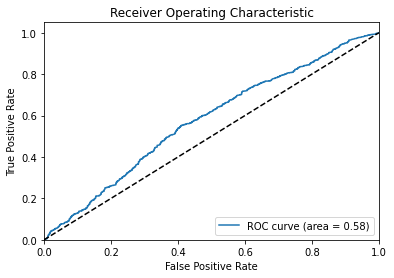

In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn import metrics
import glob

def calculate_roc_curve(true_labels, matching_scores):
    fpr, tpr, thresholds = metrics.roc_curve(true_labels, matching_scores)
    roc_auc = metrics.auc(fpr, tpr)
    return fpr, tpr, roc_auc

# 이미지 매칭 함수
def match_images(target_path, template_path):
    target = cv2.imread(target_path)
    template = cv2.imread(template_path)

    # SURF 초기화
    sift = cv2.xfeatures2d.SIFT_create()

    # 키포인트 및 디스크립터 계산
    kp1, desc1 = sift.detectAndCompute(template, None)
    kp2, desc2 = sift.detectAndCompute(target, None)

    # BFMatcher 객체 생성 및 매칭 수행
    matcher = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)
    matches = matcher.match(desc1, desc2)

    # 매칭된 키포인트 쌍에서 좋은 매칭 결과 필터링
    matches = sorted(matches, key=lambda x:x.distance)[:]

    matching_scores = [m.distance for m in matches]

    return matching_scores

# 매칭 결과 분석
def analyze_matching_performance(target_paths, template_paths):
    true_labels = []  # 실제 매칭 여부를 표시하기 위한 레이블
    matching_scores = []  # 매칭 점수를 저장할 배열

    for i, template_path in enumerate(template_paths):
        scores = match_images(target_paths[i], template_path)
        matching_scores.extend(scores)

        # 실제 매칭 여부를 레이블에 반영 (여기서는 간단하게 예시로 앞쪽 절반은 True로 설정)
        true_labels.extend([1 if i < len(target_paths) / 2 else 0] * len(scores))

    fpr, tpr, roc_auc = calculate_roc_curve(true_labels, matching_scores)

    # ROC 곡선 플롯
    plt.figure()
    plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc="lower right")
    plt.show()

# 이미지 경로 설정
target_paths = ['./img/Art/view0.png', './img/Art/view1.png', './img/Art/view2.png']
template_paths = ['./img/Art/view3.png', './img/Art/view5.png', './img/Art/view4.png']

# 매칭 결과 분석 수행
analyze_matching_performance(target_paths, template_paths)


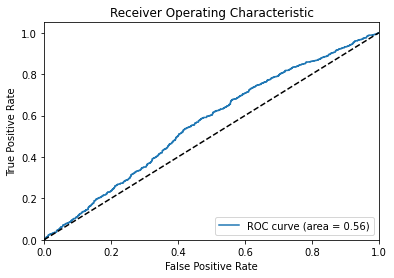

In [6]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn import metrics
import glob

def calculate_roc_curve(true_labels, matching_scores):
    fpr, tpr, thresholds = metrics.roc_curve(true_labels, matching_scores)
    roc_auc = metrics.auc(fpr, tpr)
    return fpr, tpr, roc_auc

# 이미지 매칭 함수
def match_images(target_path):
    target = cv2.imread(target_path)
    template = target[32:296, 58:242]

    # SIFT 초기화
    surf = cv2.xfeatures2d.SURF_create()

    # 키포인트 및 디스크립터 계산
    kp1, desc1 = surf.detectAndCompute(template, None)
    kp2, desc2 = surf.detectAndCompute(target, None)

    # BFMatcher 객체 생성 및 매칭 수행
    matcher = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
    matches = matcher.match(desc1, desc2)

    # 매칭된 키포인트 쌍에서 좋은 매칭 결과 필터링
    matches = sorted(matches, key=lambda x:x.distance)

    matching_scores = [m.distance for m in matches]

    return matching_scores

# 매칭 결과 분석
def analyze_matching_performance(target_paths):
    true_labels = []  # 실제 매칭 여부를 표시하기 위한 레이블
    matching_scores = []  # 매칭 점수를 저장할 배열

    for i in range(len(target_paths)):
        scores = match_images(target_paths[i])
        matching_scores.extend(scores)

        # 실제 매칭 여부를 레이블에 반영 (여기서는 간단하게 예시로 앞쪽 절반은 True로 설정)
        true_labels.extend([1 if i < len(target_paths) / 2 else 0] * len(scores))

    fpr, tpr, roc_auc = calculate_roc_curve(true_labels, matching_scores)

    # ROC 곡선 플롯
    plt.figure()
    plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc="lower right")
    plt.show()

# 이미지 경로 설정
target_paths = glob.glob('./img/Art/view*.png')

# 매칭 결과 분석 수행
analyze_matching_performance(target_paths)


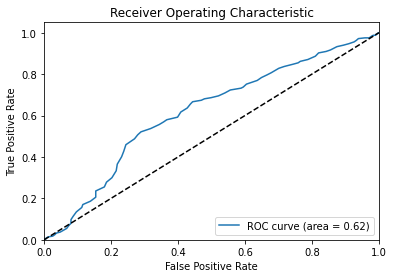

In [27]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn import metrics
import glob

def calculate_roc_curve(true_labels, matching_scores):
    fpr, tpr, thresholds = metrics.roc_curve(true_labels, matching_scores)
    roc_auc = metrics.auc(fpr, tpr)
    return fpr, tpr, roc_auc

# 이미지 매칭 함수
def match_images(target_path, template_path):
    target = cv2.imread(target_path)
    template = cv2.imread(template_path)

    # 이미지 매칭 알고리즘 수행 (여기서는 ORB를 사용한 예시)
    orb = cv2.ORB_create()
    kp1, desc1 = orb.detectAndCompute(template, None)
    kp2, desc2 = orb.detectAndCompute(target, None)

    # 매칭 결과 얻기
    matcher = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    matches = matcher.match(desc1, desc2)
    matches = sorted(matches, key=lambda x: x.distance)

    # 매칭 결과를 기반으로 실제 매칭 여부 판단
    threshold = 30  # 예시로 임계값을 30으로 설정
    matching_scores = [m.distance for m in matches]
    true_labels = [1 if score < threshold else 0 for score in matching_scores]

    # True Positive(TP)와 False Positive(FP) 레이블 구하기
    tp_labels = [1 if true_label == 1 and matching_score < threshold else 0 for true_label, matching_score in zip(true_labels, matching_scores)]
    fp_labels = [1 if true_label == 0 and matching_score < threshold else 0 for true_label, matching_score in zip(true_labels, matching_scores)]

    return tp_labels, fp_labels


# 매칭 결과 분석
def analyze_matching_performance(target_paths, template_paths):

    for i, template_path in enumerate(template_paths):
        scores = match_images(target_paths[i], template_path)
        matching_scores.extend(scores)

        # 실제 매칭 여부를 레이블에 반영 (여기서는 간단하게 예시로 앞쪽 절반은 True로 설정)
        true_labels.extend([1 if i < len(target_paths) / 2 else 0] * len(scores))

    fpr, tpr, roc_auc = calculate_roc_curve(true_labels, matching_scores)

    # ROC 곡선 플롯
    plt.figure()
    plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc="lower right")
    plt.show()

# 이미지 경로 설정
target_paths = ['./img/Art/view0.png', './img/Art/view1.png', './img/Art/view2.png']
template_paths = ['./img/Art/view3.png', './img/Art/view5.png', './img/Art/view4.png']

# 매칭 결과 분석 수행
analyze_matching_performance(target_paths, template_paths)


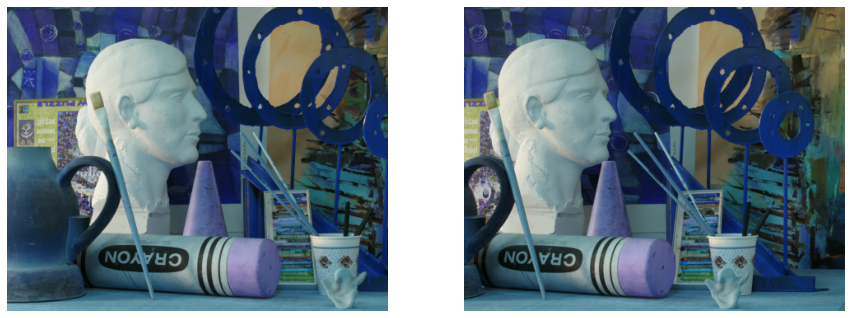

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


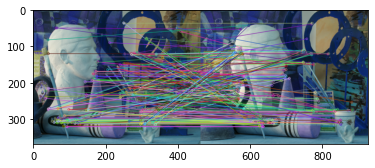

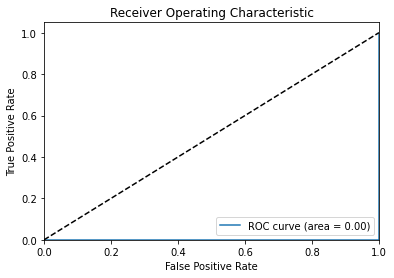

In [15]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn import metrics

def calculate_roc_curve(true_labels, matching_scores):
    fpr, tpr, thresholds = metrics.roc_curve(true_labels, matching_scores)
    roc_auc = metrics.auc(fpr, tpr)
    return fpr, tpr, roc_auc

def match_images(target, template):
    orb = cv2.ORB_create()
    kp1, desc1 = orb.detectAndCompute(template, None)
    kp2, desc2 = orb.detectAndCompute(target, None)

    matcher = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    matches = matcher.match(desc1, desc2)
    # 매칭 결과를 거리기준 오름차순으로 정렬 ---③
    matches = sorted(matches, key=lambda x:x.distance)


    
    true_labels = [1 if score < good_thresh else 0 for score in matching_scores]
    print(true_labels)

    fpr, tpr, roc_auc = calculate_roc_curve(true_labels, matching_scores)
    # Apply ratio test to filter good matches
    

    # Draw matches on the image
    match_image = cv2.drawMatches(template, kp1, target, kp2, matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    plt.imshow(match_image)

    # ROC 곡선 플롯
    plt.figure()
    plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc="lower right")
    plt.show()

# 이미지 경로와 영역 설정
target = cv2.imread('./img/Art/view0.png')
template = cv2.imread('./img/Art/view5.png')
plt.figure(figsize=(15,7))
plt.subplot(121), plt.imshow(target), plt.axis("off")
plt.subplot(122), plt.imshow(template), plt.axis("off"), plt.show()

# match_images 함수 호출 및 ROC 곡선 그리기
match_images(target, template)


Accuracy: 1.0


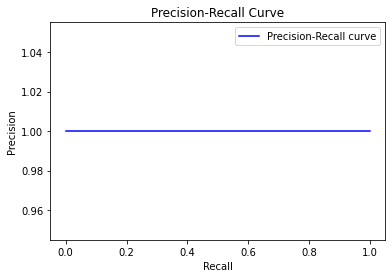

[0. 0. 0. 1.]
[0.         0.33333333 1.         1.        ]


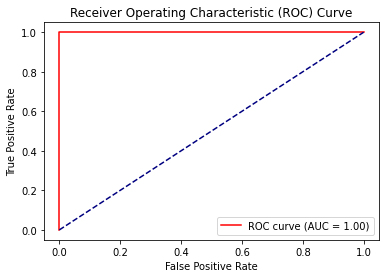

In [76]:
import numpy as np
from sklearn.metrics import accuracy_score, precision_recall_curve, roc_curve, auc
import matplotlib.pyplot as plt

# 1. 데이터셋 준비 (실제 매칭 정보와 예측 결과)
y_true = np.array([0, 0, 1, 1, 0, 1])  # 실제 매칭 정보 (0: 매칭되지 않음, 1: 매칭됨)
y_pred = np.array([0.2, 0.4, 0.7, 0.8, 0.3, 0.9])  # 예측 결과 (확률 값)

# 2. 정확도 계산
accuracy = accuracy_score(y_true, np.round(y_pred))
print("Accuracy:", accuracy)

# 3. Precision/Recall 계산
precision, recall, thresholds = precision_recall_curve(y_true, y_pred)

# 4. Precision/Recall 그래프
plt.plot(recall, precision, color='b', label='Precision-Recall curve')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc='best')
plt.show()

# 5. ROC 커브 계산
fpr, tpr, roc_thresholds = roc_curve(y_true, y_pred)
print(fpr)
print(tpr)

# 6. ROC 커브 그리기
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, color='r', label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='best')
plt.show()